In [19]:
import pandas as pd
import numpy as np

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

%matplotlib inline
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
# import autocorrelation function
from pandas.plotting import autocorrelation_plot

import pickle

import warnings
warnings.filterwarnings('ignore')

In [3]:
# encoding = 'CP949'
filename = 'gasoline_price.csv'

data = pd.read_csv(filename)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5708 entries, 0 to 5707
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   구분      5708 non-null   object 
 1   서울      5708 non-null   float64
dtypes: float64(1), object(1)
memory usage: 89.3+ KB


## 2. Data Preparation

Gasoline data

In [4]:
"""Date format preprocessing"""
char_replace = ['년', '월']

for char in char_replace:
    data['구분'] = data['구분'].str.replace(char, '-')

data['구분'] = data['구분'].str.replace('일', '')
#data['구분'] = data['구분'].str[:-1]

data.rename({'구분':'Day'}, axis=1, inplace = True)

data['Date'] = pd.to_datetime(data['Day'], errors='coerce', format='%Y-%m-%d')

data.set_index('Date', inplace=True)
data.sort_index(inplace=True)

data.reset_index(inplace=True)

data = data.drop('Day', axis = 1)

In [5]:
"""Drop last row of Gasoline data to match the data"""
data = data[:-1]

In [6]:
data.rename(columns = {'서울' : 'Gasoline'}, inplace=True)

In [7]:
data.head(3)

,Date,Gasoline
0,2008-04-15,1734.58
1,2008-04-16,1749.97
2,2008-04-17,1744.71


### Visualization (Gasoline)

In [8]:
fig = px.line(data, x='Date', y='Gasoline', title = 'Price of Gasoline in Seoul from 2008 to 2023',
              labels = {
                  "Date" : "Year",
                  "Gasoline" : "Gasoline Price (won)"
              },
              template = 'plotly_dark')
fig.show()

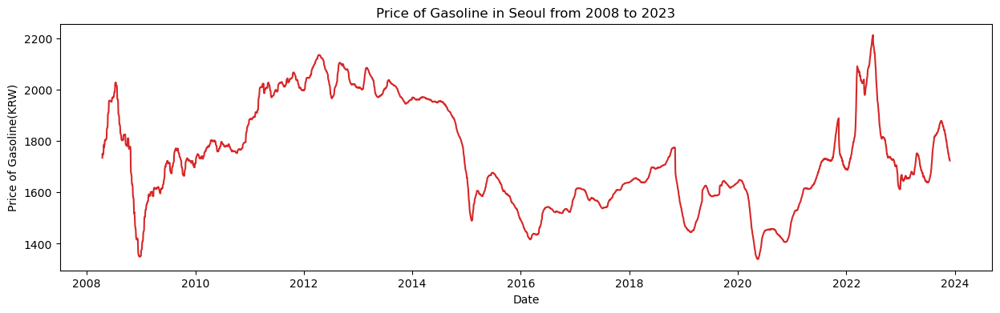

In [9]:
#dpi = 100
plt.figure(figsize=(15,4))#, dpi=dpi)
plt.plot(data['Date'], data['Gasoline'], color='tab:red')
plt.xlabel('Date')
plt.ylabel('Price of Gasoline(KRW)')
plt.title('Price of Gasoline in Seoul from 2008 to 2023')
         
plt.show()

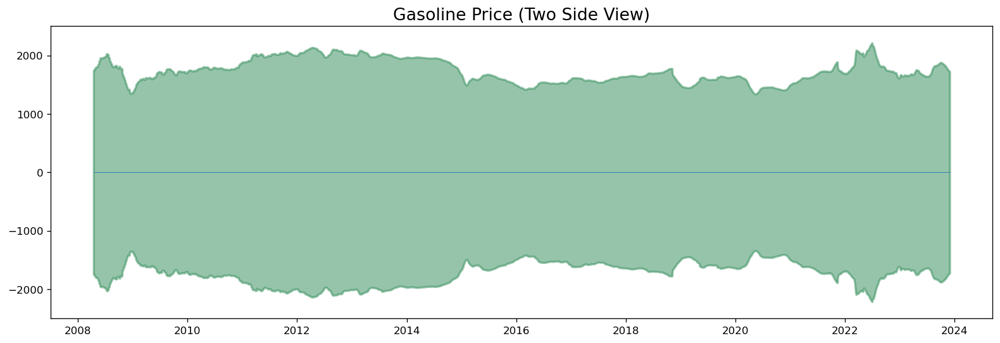

In [10]:
x = data['Date'].values
y1 = data['Gasoline'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-2500, 2500)
plt.title('Gasoline Price (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(data['Date']), xmax=np.max(data['Date']), linewidth=.5)
plt.show()

##### Heatmap (Gasoline)

In [11]:
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

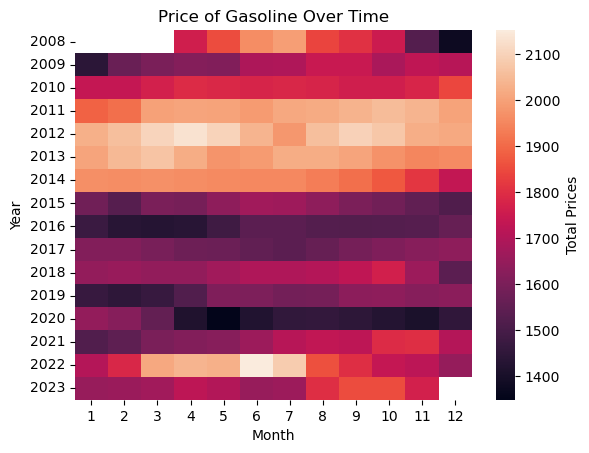

In [40]:
# re-format the data for the heat-map
price_month_year = data.pivot_table(index="year", columns="month", values="Gasoline", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_year, cbar_kws={"label": "Total Prices"})
plt.title("Price of Gasoline Over Time")
plt.xlabel("Month")
plt.ylabel("Year")
plt.show()

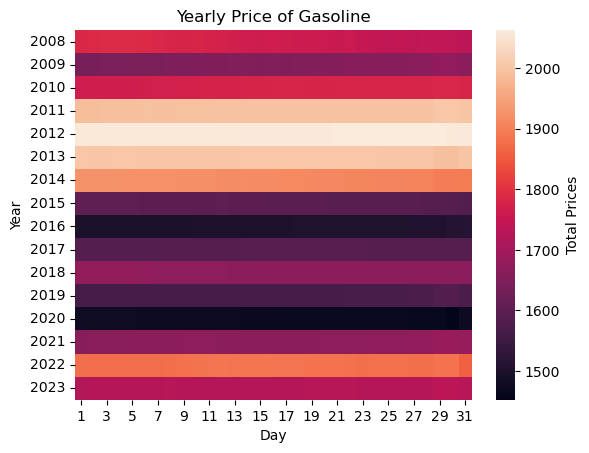

In [41]:
# re-format the data for the heat-map
price_month_day = data.pivot_table(index="year", columns="day", values="Gasoline", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_day, cbar_kws={"label": "Total Prices"})
plt.title("Yearly Price of Gasoline")
plt.xlabel("Day")
plt.ylabel("Year")
plt.show()

연도별 가격이 어느 정도였는지 대략 알 수 있다.

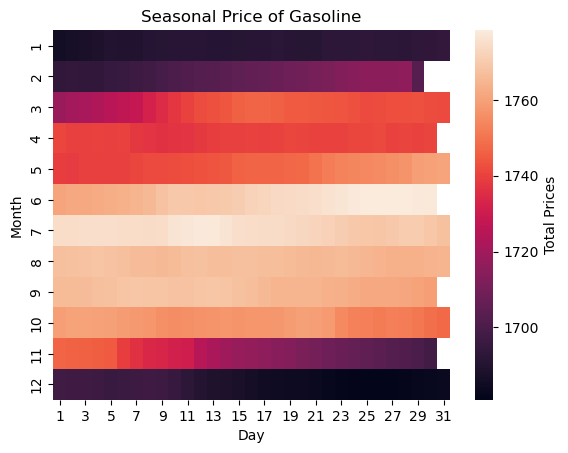

In [42]:
# re-format the data for the heat-map
price_month_day = data.pivot_table(index="month", columns="day", values="Gasoline", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_day, cbar_kws={"label": "Total Prices"})
plt.title("Seasonal Price of Gasoline")
plt.xlabel("Day")
plt.ylabel("Month")
plt.show()

겨울에는 비교적 가격이 하락하고 여름과 가을에 가격이 상승하는 경향을 볼 수 있다.

##### Auto Correlation

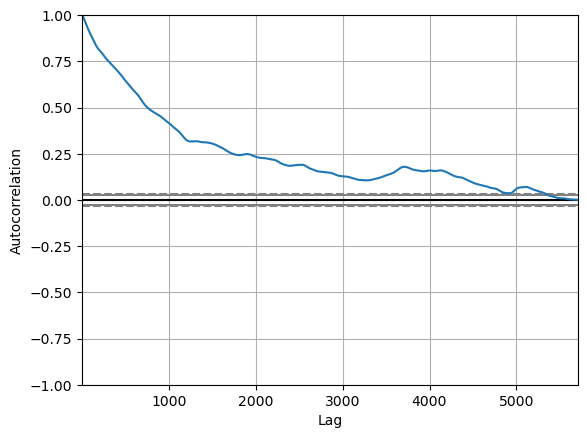

In [43]:
year_data = data[['year', 'Gasoline']]

# autocorrelation plot
autocorrelation_plot(year_data)
plt.show()

## Decomposition of a Time Series

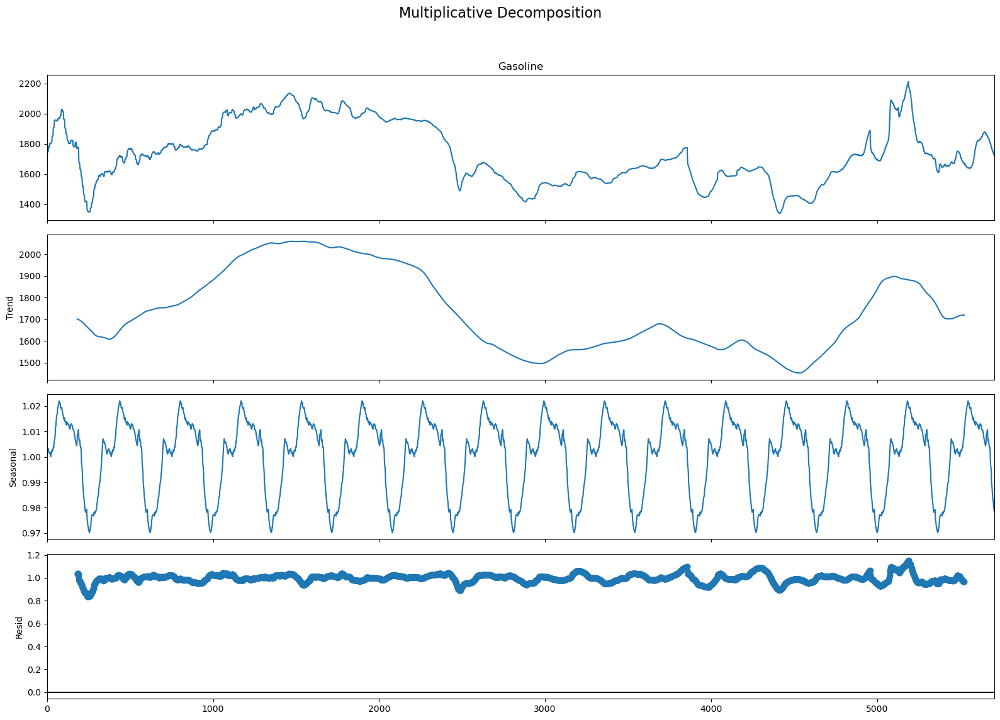

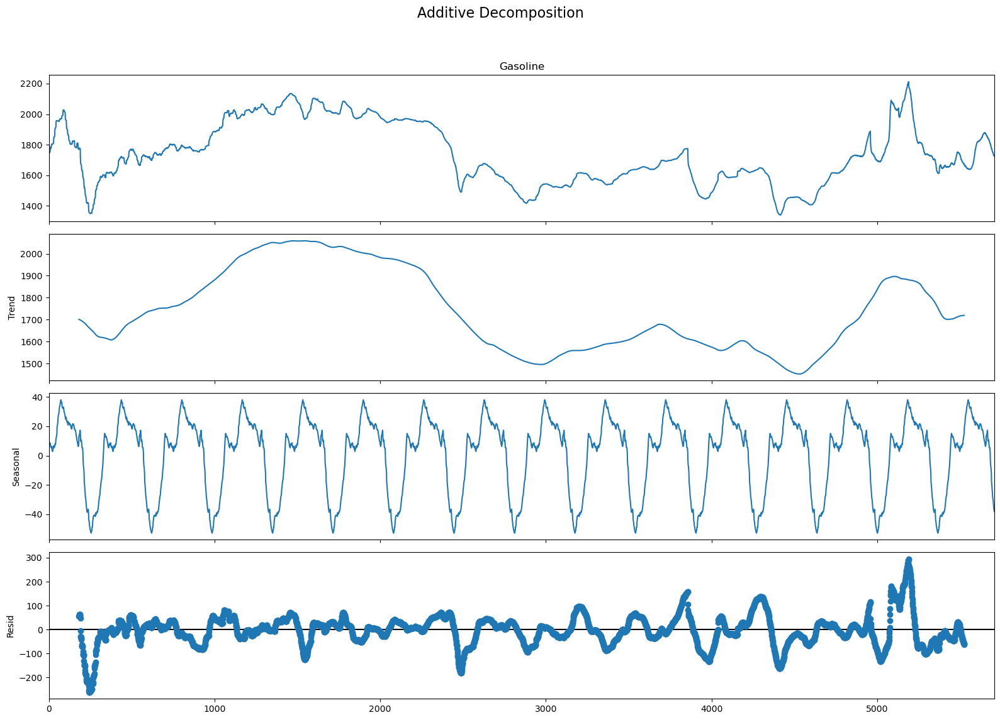

In [44]:
# Multiplicative Decomposition 
multiplicative_decomposition = seasonal_decompose(data['Gasoline'], model='multiplicative', period=365)

# Additive Decomposition
additive_decomposition = seasonal_decompose(data['Gasoline'], model='additive', period=365)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

#### ADF test

In [45]:
def adf_test(data):
    result = adfuller(data.values)
    print('ADF Statistics: %f' % result[0])
    print('p-value: %f' % result[1])
    print('num of lags: %f' % result[2])
    print('num of observations: %f' % result[3])
    print('Critical values:')
    for k, v in result[4].items():
        print('\t%s: %.3f' % (k,v))

print('ADF TEST 결과')
adf_test(data['Gasoline'])

ADF TEST 결과
ADF Statistics: -2.812807
p-value: 0.056468
num of lags: 22.000000
num of observations: 5684.000000
Critical values:
	1%: -3.432
	5%: -2.862
	10%: -2.567


P value is 0.0572, which is greater than 0.05.
<br>
Thus, It is not significant, which means the data is $Non-Stationary$.
<br>
Although I doubt that p-value is significant.

## NeuralProphet

In [14]:
gasoline = data[["Date", "Gasoline"]]
gasoline.rename(columns = {'Date':'ds', 'Gasoline':'y'}, inplace = True)

neural = gasoline.reset_index(drop=True)

In [15]:
neural

,ds,y
0,2008-04-15,1734.58
1,2008-04-16,1749.97
2,2008-04-17,1744.71
3,2008-04-18,1748.01
4,2008-04-19,1748.87
...,...,...
5702,2023-11-25,1730.41
5703,2023-11-26,1729.95
5704,2023-11-27,1730.44
5705,2023-11-28,1727.37


### 1. Train
- simple prophet
- a few year ago you had to set epoch, but now it automatically selects

In [16]:
m = NeuralProphet(quantiles=[0.05, 0.95],
                  yearly_seasonality="auto",
                  weekly_seasonality="auto",
                  daily_seasonality="auto",
                  optimizer = 'SGD')

m.set_plotting_backend("plotly")  # show plots correctly in jupyter notebooks

metrics = m.fit(neural)

Finding best initial lr:   0%|          | 0/244 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

In [17]:
forecast = m.predict(neural)

Predicting: 179it [00:00, ?it/s]

In [18]:
fig1 = m.plot(forecast)
fig1

This is a simple model with a trend, a weekly seasonality and a yearly seasonality estimated by default. You can also look at the individual components separately as below.

In [20]:
m.plot_components(forecast)

In [21]:
m.plot_parameters()

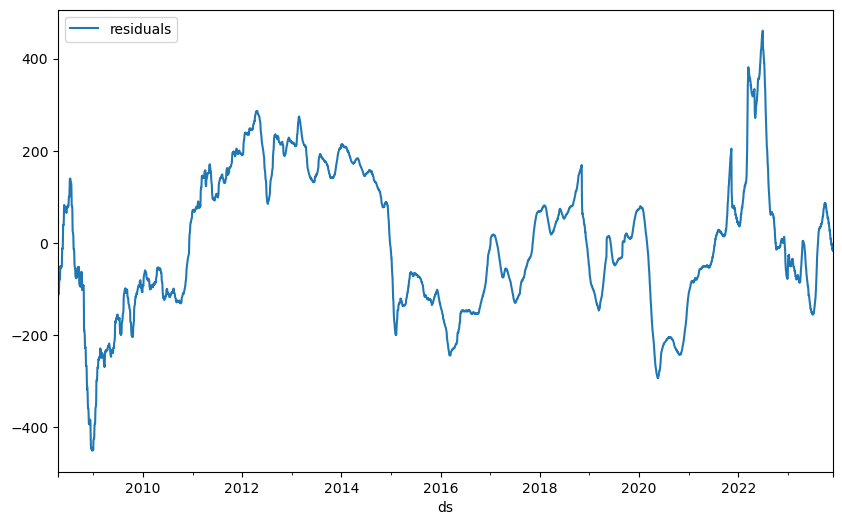

In [22]:
df_residuals = pd.DataFrame({"ds": neural["ds"], "residuals": neural["y"] - forecast["yhat1"]})
fig = df_residuals.plot(x="ds", y="residuals", figsize=(10, 6))

### 2. Forecast Away

In [23]:
metrics

,MAE,RMSE,Loss,RegLoss,epoch
0,610.604065,755.342468,0.690550,0.0,0
1,547.523865,680.430969,0.548118,0.0,1
2,468.538849,584.490295,0.399017,0.0,2
3,379.812897,474.759003,0.262743,0.0,3
4,294.067047,365.750092,0.163166,0.0,4
...,...,...,...,...,...
114,126.979660,151.232193,0.020283,0.0,114
115,126.977783,151.631439,0.020286,0.0,115
116,127.141266,151.631638,0.020331,0.0,116
117,127.054657,151.602600,0.020289,0.0,117


In [24]:
future = m.make_future_dataframe(neural, periods = 2555)
forecast1 = m.predict(future)
forecast1.head()

Predicting: 179it [00:00, ?it/s]

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly
0,2023-11-30,None,1738.844849,1604.450317,1919.116211,1775.403809,-36.611660,0.052637
1,2023-12-01,None,1737.354736,1602.449707,1917.345703,1775.518066,-37.938602,-0.224740
2,2023-12-02,None,1736.109253,1600.956665,1916.536011,1775.632324,-39.199863,-0.323167
3,2023-12-03,None,1734.995239,1599.524292,1915.352173,1775.746582,-40.392330,-0.359024
4,2023-12-04,None,1734.366943,1598.126709,1915.105957,1775.860840,-41.513355,0.019557


In [25]:
forecast1.tail()

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly
2550,2030-11-23,None,2040.114502,1987.865967,2341.251953,2066.678223,-26.240625,-0.323167
2551,2030-11-24,None,2038.530762,1985.792236,2339.179932,2066.792480,-27.902737,-0.359024
2552,2030-11-25,None,2037.397217,1983.707642,2337.989502,2066.906738,-29.529051,0.019557
2553,2030-11-26,None,2036.395508,1982.371460,2337.098145,2067.020996,-31.114334,0.488978
2554,2030-11-27,None,2034.827393,1980.018677,2335.601318,2067.135254,-32.653610,0.345760


In [26]:
fig2 = m.plot(forecast1)
fig2

In [27]:
fig = go.Figure(data = fig1.data + fig2.data)
fig.show()

In [28]:
forecast1['yhat1'].astype(int)

0       1738
1       1737
2       1736
3       1734
4       1734
        ... 
2550    2040
2551    2038
2552    2037
2553    2036
2554    2034
Name: yhat1, Length: 2555, dtype: int32

In [29]:
results_df = forecast1[['ds', 'yhat1', 'yhat1 5.0%', 'yhat1 95.0%']]
results_df['yhat1'] = forecast1['yhat1'].astype(int)
results_df['yhat1 5.0%'] = forecast1['yhat1 5.0%'].astype(int)
results_df['yhat1 95.0%'] = forecast1['yhat1 95.0%'].astype(int)
results_df.columns = ['Date', 'Predicted Price', 'Predicted Price 5.0%', 'Predicted Price 95%']

In [84]:
results_df

,Date,Predicted Price,Predicted Price 5.0%,Predicted Price 95%
0,2023-11-30,1743,1580,1899
1,2023-12-01,1741,1578,1897
2,2023-12-02,1740,1576,1895
3,2023-12-03,1739,1575,1894
4,2023-12-04,1738,1574,1894
...,...,...,...,...
2550,2030-11-23,2063,1906,2265
2551,2030-11-24,2062,1904,2263
2552,2030-11-25,2061,1902,2262
2553,2030-11-26,2060,1901,2261


In [85]:
results_df.to_csv("results.csv", encoding='utf-8', index=False)

### 3. Save Model

In [30]:
with open("forecast_model_231205.pki", "wb") as f:
    pickle.dump(m, f)

In [31]:
m

In [34]:
with open("forecast_model_231205.pki", "rb") as f:
    m = pickle.load(f)

In [35]:
m.restore_trainer()

In [36]:
future = m.make_future_dataframe(neural, periods = 2555)
forecast = m.predict(future)
forecast.head()

Predicting: 0it [00:00, ?it/s]

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly
0,2023-11-30,None,1738.844849,1604.450317,1919.116211,1775.403809,-36.611660,0.052637
1,2023-12-01,None,1737.354736,1602.449707,1917.345703,1775.518066,-37.938602,-0.224740
2,2023-12-02,None,1736.109253,1600.956665,1916.536011,1775.632324,-39.199863,-0.323167
3,2023-12-03,None,1734.995239,1599.524292,1915.352173,1775.746582,-40.392330,-0.359024
4,2023-12-04,None,1734.366943,1598.126709,1915.105957,1775.860840,-41.513355,0.019557


In [37]:
forecast.tail()

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly
2550,2030-11-23,None,2040.114502,1987.865967,2341.251953,2066.678223,-26.240625,-0.323167
2551,2030-11-24,None,2038.530762,1985.792236,2339.179932,2066.792480,-27.902737,-0.359024
2552,2030-11-25,None,2037.397217,1983.707642,2337.989502,2066.906738,-29.529051,0.019557
2553,2030-11-26,None,2036.395508,1982.371460,2337.098145,2067.020996,-31.114334,0.488978
2554,2030-11-27,None,2034.827393,1980.018677,2335.601318,2067.135254,-32.653610,0.345760


In [38]:
fig3 = m.plot(forecast)
fig3

In [39]:
fig = go.Figure(data = fig1.data + fig3.data)
fig.show()

- end of program